In [ ]:
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

--2023-12-11 21:44:09--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 104.122.27.233, 2a02:26f0:61:1a4::317f, 2a02:26f0:61:180::317f
Connecting to download.microsoft.com (download.microsoft.com)|104.122.27.233|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M  65.6MB/s    in 10s     

2023-12-11 21:44:19 (76.4 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]



In [ ]:
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
from keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

In [ ]:
input_path = []
label = []

for class_name in os.listdir("PetImages"):
    for path in os.listdir("PetImages/"+class_name):
        if class_name == 'Cat':
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join("PetImages", class_name, path))
print(input_path[0], label[0])

PetImages/Dog/5422.jpg 1


In [ ]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages/Cat/4450.jpg,0
1,PetImages/Dog/9107.jpg,1
2,PetImages/Cat/2079.jpg,0
3,PetImages/Cat/12021.jpg,0
4,PetImages/Cat/1609.jpg,0


In [ ]:
for i in df['images']:
    if '.jpg' not in i:
        print(i)

PetImages/Dog/Thumbs.db
PetImages/Cat/Thumbs.db


In [ ]:
import PIL
l = []
for image in df['images']:
    try:
        img = PIL.Image.open(image)
    except:
        l.append(image)
l

['PetImages/Cat/666.jpg',
 'PetImages/Dog/11702.jpg',
 'PetImages/Dog/Thumbs.db',
 'PetImages/Cat/Thumbs.db']

In [ ]:
# delete db files
df = df[df['images']!='PetImages/Dog/Thumbs.db']
df = df[df['images']!='PetImages/Cat/Thumbs.db']
df = df[df['images']!='PetImages/Cat/666.jpg']
df = df[df['images']!='PetImages/Dog/11702.jpg']
len(df)

24998

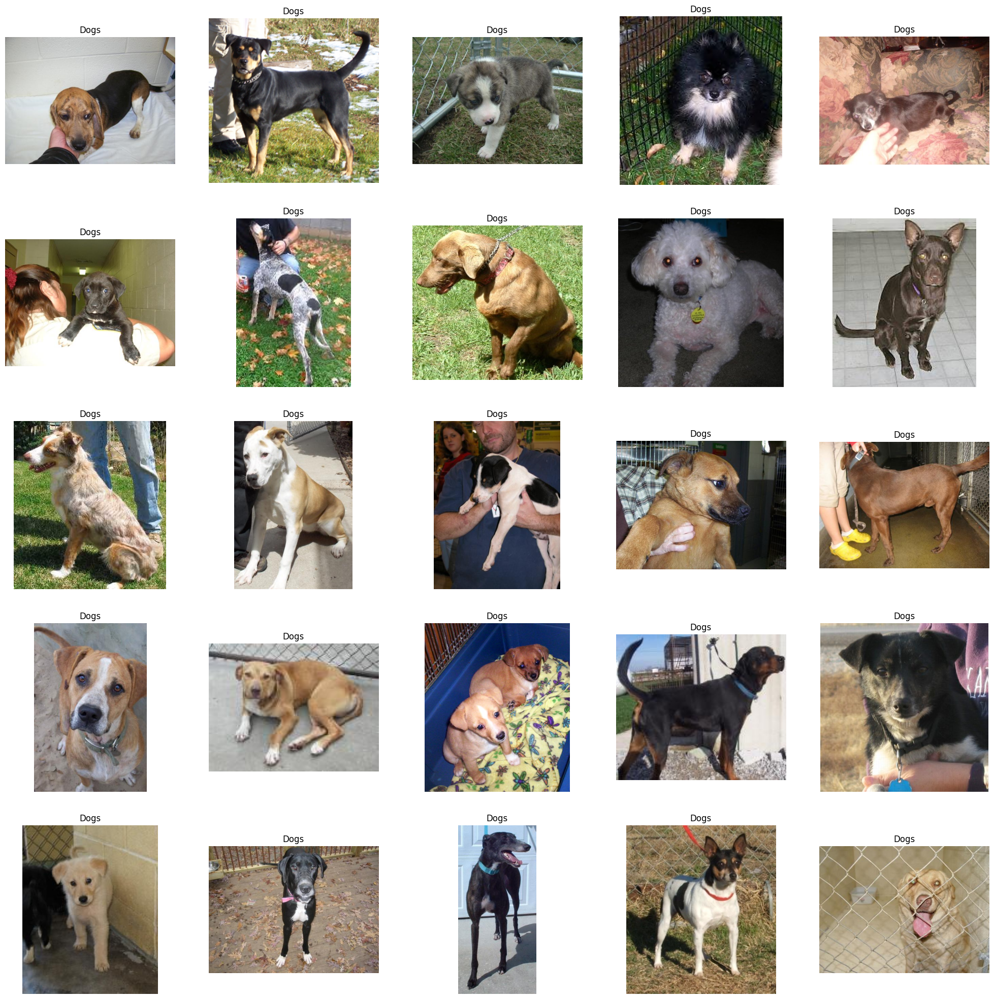

In [ ]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

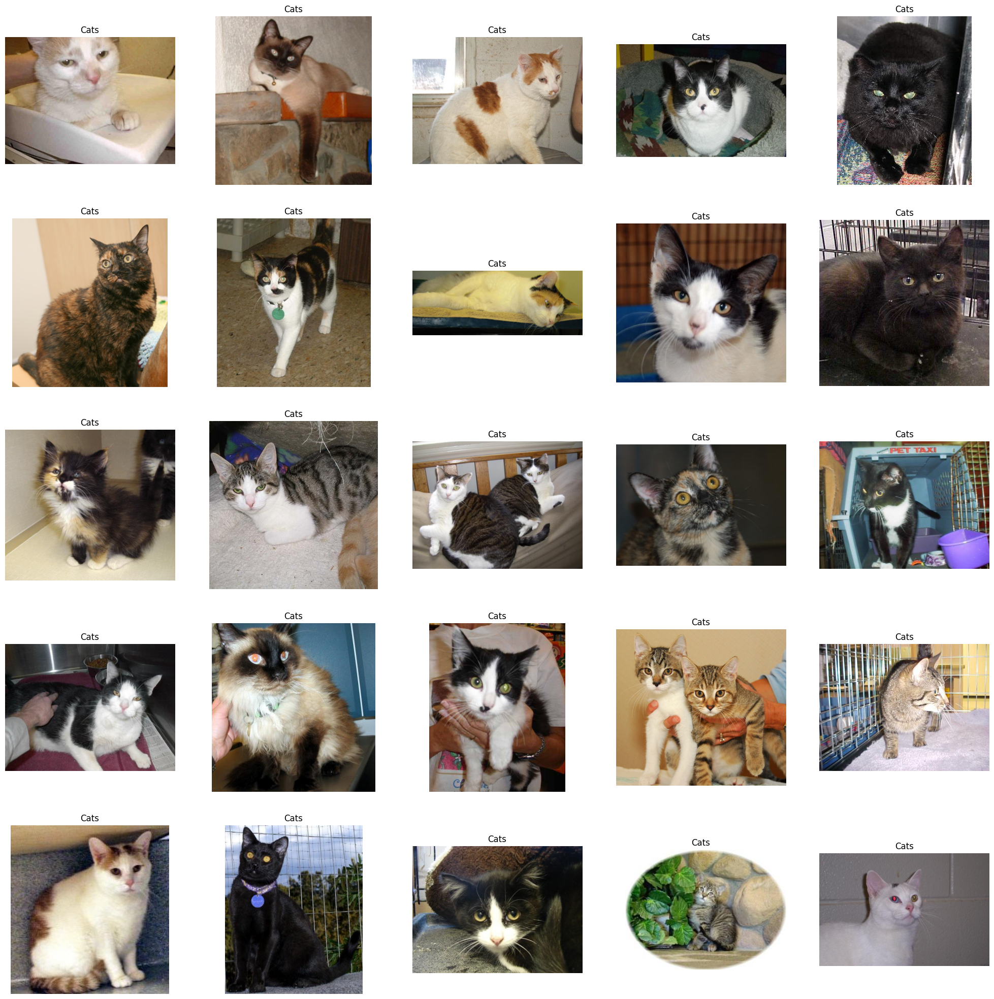

In [ ]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

In [ ]:
df['label'] = df['label'].astype('str')

In [ ]:
df.head()

,images,label
0,PetImages/Cat/4450.jpg,0
1,PetImages/Dog/9107.jpg,1
2,PetImages/Cat/2079.jpg,0
3,PetImages/Cat/12021.jpg,0
4,PetImages/Cat/1609.jpg,0


In [ ]:
# input split
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale = 1./255,  # normalization of images
    rotation_range = 40, # augmention of images to avoid overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)

train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


In [ ]:
import tensorflow as tf

# Define the Sequential model
model_A = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the Sequebntial model
model_A.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Display model summary
model_A.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 14, 14, 128)       0

In [ ]:
import tensorflow as tf

# Download InceptionV3 weights
inception_weights_path = tf.keras.utils.get_file(
    'inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5',
    'https://storage.googleapis.com/tensorflow/keras-applications/inception_v3/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5',
    cache_subdir='models',
    file_hash='bcbd6486424b2319ff4ef7d526e38f63')

print("Downloaded InceptionV3 weights:", inception_weights_path)


87910968/87910968 [==============================] - 3s 0us/step
Downloaded InceptionV3 weights: /root/.keras/models/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5


In [ ]:
from tensorflow.keras.applications import InceptionV3

# Load the pre-trained InceptionV3 model with ImageNet weights
inception_model = InceptionV3(weights='imagenet', include_top=False)

# Freeze layers in the pre-trained model
for layer in inception_model.layers:
    layer.trainable = False

# Create a Sequential model with InceptionV3 base
model_B = tf.keras.models.Sequential([
    inception_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compile the model
model_B.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Display model summary
model_B.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, None, None, 2048   21802784  
                             )                                   
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense_2 (Dense)             (None, 512)               1049088   
                                                                 
 dense_3 (Dense)             (None, 1)                 513       
                                                                 
Total params: 22852385 (87.17 MB)
Trainable params: 1049601 (4.00 MB)
Non-trainable params: 21802784 (83.17 MB)
_________________________________________________________________


Epoch 1/10
40/40 [==============================] - 129s 3s/step - loss: 0.6799 - accuracy: 0.5621 - val_loss: 0.6592 - val_accuracy: 0.6034
Epoch 2/10
40/40 [==============================] - 127s 3s/step - loss: 0.6108 - accuracy: 0.6641 - val_loss: 0.6138 - val_accuracy: 0.6632
Epoch 3/10
40/40 [==============================] - 129s 3s/step - loss: 0.5632 - accuracy: 0.7053 - val_loss: 0.5344 - val_accuracy: 0.7258
Epoch 4/10
40/40 [==============================] - 123s 3s/step - loss: 0.5241 - accuracy: 0.7355 - val_loss: 0.5865 - val_accuracy: 0.7056
Epoch 5/10
40/40 [==============================] - 120s 3s/step - loss: 0.5076 - accuracy: 0.7491 - val_loss: 0.4976 - val_accuracy: 0.7542
Epoch 6/10
40/40 [==============================] - 123s 3s/step - loss: 0.4758 - accuracy: 0.7693 - val_loss: 0.4501 - val_accuracy: 0.7916
Epoch 7/10
40/40 [==============================] - 131s 3s/step - loss: 0.4568 - accuracy: 0.7846 - val_loss: 0.4316 - val_accuracy: 0.7978
Epoch 8/10
40

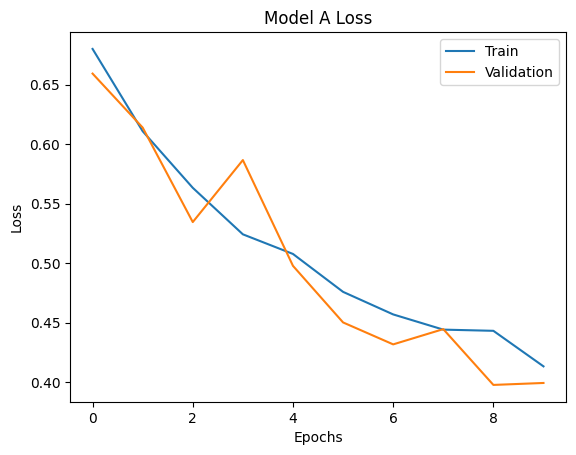

Epoch 1/10
40/40 [==============================] - 138s 3s/step - loss: 1.0157 - accuracy: 0.7858 - val_loss: 0.1909 - val_accuracy: 0.9184
Epoch 2/10
40/40 [==============================] - 126s 3s/step - loss: 0.2369 - accuracy: 0.8931 - val_loss: 0.1630 - val_accuracy: 0.9304
Epoch 3/10
40/40 [==============================] - 123s 3s/step - loss: 0.2184 - accuracy: 0.9047 - val_loss: 0.1597 - val_accuracy: 0.9310
Epoch 4/10
40/40 [==============================] - 125s 3s/step - loss: 0.2112 - accuracy: 0.9074 - val_loss: 0.1541 - val_accuracy: 0.9332
Epoch 5/10
40/40 [==============================] - 122s 3s/step - loss: 0.2084 - accuracy: 0.9089 - val_loss: 0.1485 - val_accuracy: 0.9374
Epoch 6/10
40/40 [==============================] - 124s 3s/step - loss: 0.2013 - accuracy: 0.9133 - val_loss: 0.1554 - val_accuracy: 0.9324
Epoch 7/10
40/40 [==============================] - 125s 3s/step - loss: 0.1992 - accuracy: 0.9135 - val_loss: 0.1460 - val_accuracy: 0.9374
Epoch 8/10
40

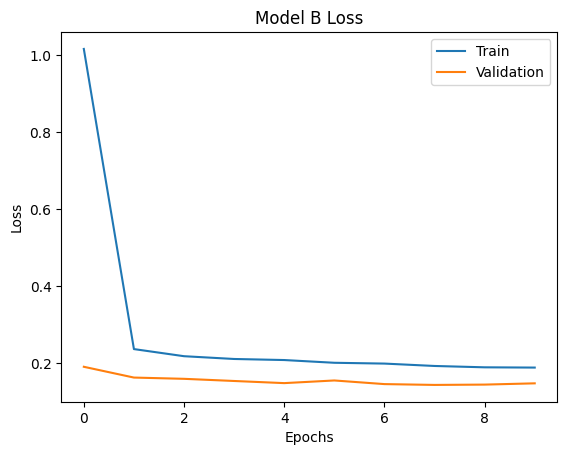

In [ ]:
# Train Model A (Sequential CNN)
history_A = model_A.fit(train_iterator, epochs=10, validation_data=val_iterator)

# Plot training & validation loss values for Model A
plt.plot(history_A.history['loss'])
plt.plot(history_A.history['val_loss'])
plt.title('Model A Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

# Train Model B (Pre-trained InceptionV3) and plot its losses
history_B = model_B.fit(train_iterator, epochs=10, validation_data=val_iterator)

plt.plot(history_B.history['loss'])
plt.plot(history_B.history['val_loss'])
plt.title('Model B Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()


In [ ]:
from tensorflow.keras.preprocessing.image import load_img
import numpy as np

# Loading the image
image_path = "/content/c1.jpg"  # path of the image
img = load_img(image_path, target_size=(128, 128))
img = np.array(img)
img = img / 255.0  # normalize the image
img = img.reshape(1, 128, 128, 3)  # reshape for prediction

# Predict using model_B
pred = model_B.predict(img)

# Check the prediction
if pred[0] > 0.5:
    label = 'Dog'
else:
    label = 'Cat'

print(label)


1/1 [==============================] - 9s 9s/step
Cat
